In [1]:
# Install Essential Libraries
!pip install ultralytics --no-deps
# !pip install opencv-python-headless

  Using cached ultralytics-8.3.217-py3-none-any.whl.metadata (37 kB)
Using cached ultralytics-8.3.217-py3-none-any.whl (1.1 MB)


# Import Ultralytics

In [2]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.217  Python-3.12.3 torch-2.7.1+cu126 CUDA:0 (NVIDIA GeForce 940MX, 2048MiB)
Setup complete  (4 CPUs, 11.9 GB RAM, 30.8/48.8 GB disk)


In [3]:
import sys, importlib, inspect
import numpy as np, scipy, matplotlib
try:
    import seaborn as sns
    print("seaborn:", sns.__version__, "path:", sns.__file__)
    import seaborn.utils as su
    print("seaborn.utils members:", [m for m in dir(su) if m.startswith("_version")])
except Exception as e:
    print("ERROR:", e)

print("python:", sys.version.splitlines()[0])
print("numpy:", np.__version__)
print("scipy:", scipy.__version__)
print("matplotlib:", matplotlib.__version__)


seaborn: 0.13.2 path: C:\Users\Administrator\anaconda3\Lib\site-packages\seaborn\__init__.py
seaborn.utils members: ['_version_predates']
python: 3.12.3 | packaged by conda-forge | (main, Apr 15 2024, 18:20:11) [MSC v.1938 64 bit (AMD64)]
numpy: 1.26.4
scipy: 1.16.1
matplotlib: 3.10.3


In [4]:
import os
import random
import pandas as pd
import numpy as np
import shutil
#import albumentations as A
from PIL import Image
import cv2
from ultralytics import YOLO
from IPython.display import Video

import matplotlib.pyplot as plt
import seaborn as sns
#sns.set(style='darkgrid')
import pathlib
from glob import glob
from tqdm.notebook import trange, tqdm


import warnings
warnings.filterwarnings('ignore')

# Show some train images

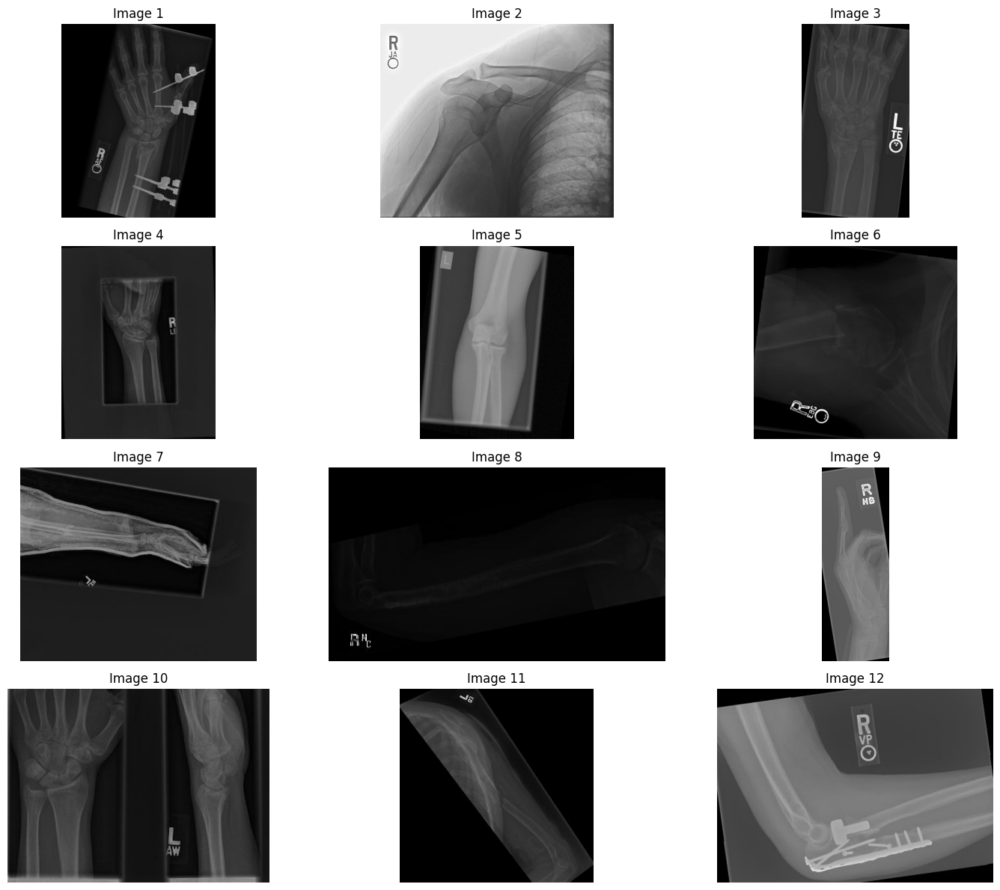

In [5]:
Image_dir = '/kaggle/input/bone-fracture-detection-computer-vision-project/BoneFractureYolo8/train/images'

num_samples = 12
image_files = os.listdir(Image_dir)

# Randomly select num_samples images
rand_images = random.sample(image_files, num_samples)

fig, axes = plt.subplots(4, 3, figsize=(15, 12))

for i in range(num_samples):
    image = rand_images[i]
    ax = axes[i // 3, i % 3]
    ax.imshow(plt.imread(os.path.join(Image_dir, image)))
    ax.set_title(f'Image {i+1}')
    ax.axis('off')

plt.tight_layout()
plt.show()

In [7]:
dataset_path = "/kaggle/input/bone-fracture-detection-computer-vision-project/BoneFractureYolo8"

processed_dataset_path = "/kaggle/working/BoneFracture_Preprocessed"

os.makedirs("/kaggle/working/Results/", exist_ok=True)

# Preprocessing function

In [12]:
for dire in ['train','valid','test']:
    
    os.makedirs(f"{processed_dataset_path}/{dire}/images", exist_ok=True)
    os.makedirs(f"{processed_dataset_path}/{dire}/labels", exist_ok=True)


# processed funtion
def processed_img(img_path):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

    # CLAHE
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    img = clahe.apply(img)

    # Gaussian Blur
    img = cv2.GaussianBlur(img, (5,5), 0)

    # Optional: Edge enhancement (comment if not needed)
    edges = cv2.Canny(img, 100, 200)
    img = cv2.addWeighted(img, 0.8, edges, 0.2, 0)

    # Normalize and convert back
    img = img / 255.0
    
    return (img * 255).astype(np.uint8)

In [13]:
# Preprocess images and copy labels
for split in ["train", "valid", "test"]:
    images_dir = f"{dataset_path}/{split}/images"
    labels_dir = f"{dataset_path}/{split}/labels"
    output_images_dir = f"{processed_dataset_path}/{split}/images"
    output_labels_dir = f"{processed_dataset_path}/{split}/labels"

    for img_file in tqdm(os.listdir(images_dir), desc=f"Processing {split} images"):
        img_path = os.path.join(images_dir, img_file)
        
        processed_image = processed_img(img_path)   # FUNCTION CALLED
        
        cv2.imwrite(os.path.join(output_images_dir, img_file), processed_image)

        # Copy corresponding label
        label_file = img_file.replace(".jpg", ".txt")
        if os.path.exists(os.path.join(labels_dir, label_file)):
            shutil.copy(os.path.join(labels_dir, label_file), os.path.join(output_labels_dir, label_file))

print("✅ Preprocessing complete!")



# Create YAML config
yaml_path_fixed = "/kaggle/working/data.yaml"
yaml_content = f"""
train: {processed_dataset_path}/train/images
val: {processed_dataset_path}/valid/images
test: {processed_dataset_path}/test/images

nc: 6
names: ["Elbow Positive", "Fingers Positive", "Forearm Fracture", "Humerus Fracture", "Shoulder Fracture", "Wrist Positive"]
"""

with open(yaml_path_fixed, "w") as f:
    f.write(yaml_content)

print("✅ data.yaml created.")

Processing train images:   0%|          | 0/3631 [00:00<?, ?it/s]

Processing valid images:   0%|          | 0/348 [00:00<?, ?it/s]

Processing test images:   0%|          | 0/169 [00:00<?, ?it/s]

✅ Preprocessing complete!
✅ data.yaml created.


# YOLO11s model loaded

In [14]:
# Use a pretrained YOLOv8n model
# model = YOLO("yolov8n.pt") 
model = YOLO('yolo11s.pt')
# model = YOLO('yolov8m.pt')

# Image predict use pre-trained yolo model

In [15]:
image = "/kaggle/input/bone-fracture-detection-computer-vision-project/BoneFractureYolo8/train/images/image1_1014_png.rf.3c994368f0740a7339e332685995b34f.jpg"

im = cv2.imread(image)
if im is None:
    print("Failed to load image")
else:
    print("Image shape:", im.shape)

Image shape: (512, 295, 3)


In [16]:
result = model.predict(source=image, imgsz=512)


image 1/1 /kaggle/input/bone-fracture-detection-computer-vision-project/BoneFractureYolo8/train/images/image1_1014_png.rf.3c994368f0740a7339e332685995b34f.jpg: 512x320 1 person, 1 tie, 64.6ms
Speed: 5.9ms preprocess, 64.6ms inference, 2.4ms postprocess per image at shape (1, 3, 512, 320)


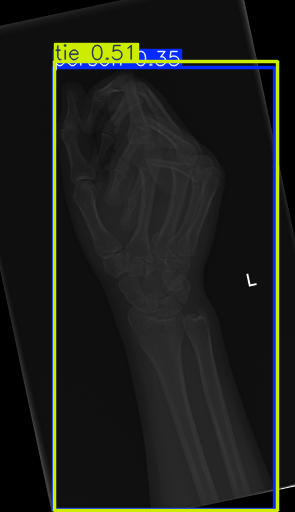

In [17]:
#show results
plot = result[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))

# Model training

In [18]:
results = model.train(
    data = yaml_path_fixed,
    epochs=50,
    imgsz=640,  # Increase resolution for small objects
    patience=10,
    batch=16,  # 16 instead of 32, depending on GPU memory
    optimizer='auto',  # Use SGD for better generalization # auto
    lr0=0.001,  # 0.0001 is a bit low, 0.001 might allow faster learning
    lrf=0.01,  # To reduce the final learning rate
    seed=0,
    dropout=0.2,
    #iou=0.6,  # IoU threshold for NMS
    #hsv_h=0.015,  # Color augmentation 
    # hsv_s=0.7,
    # hsv_v=0.4,
    project="yolo_training",
    name="fracture_detector_v1",
    plots=True
)

Ultralytics 8.3.217 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.2, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=fracture_detector_v1, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=5, perspective=0.0, plots=T

In [19]:
metrics = model.val()

Ultralytics 8.3.217 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 100 layers, 9,415,122 parameters, 0 gradients
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 706.3±426.6 MB/s, size: 25.0 KB)
val: Scanning /kaggle/working/BoneFracture_Preprocessed/valid/labels.cache... 348 images, 175 backgrounds, 17 corrupt: 100% ━━━━━━━━━━━━ 348/348 641.9Kit/s 0.0s
val: /kaggle/working/BoneFracture_Preprocessed/valid/images/image1_1090_png.rf.de645f822a5e36175c5e988223f4eeb0.jpg: ignoring corrupt image/label: Label class 6 exceeds dataset class count 6. Possible class labels are 0-5
val: /kaggle/working/BoneFracture_Preprocessed/valid/images/image1_111_png.rf.3893d8f7588cea4d796d26119e52637f.jpg: ignoring corrupt image/label: Label class 6 exceeds dataset class count 6. Possible class labels are 0-5
val: /kaggle/working/BoneFracture_Preprocessed/valid/images/image1_119_png.rf.77de12cb566fc295603927e2a5b2748a.jpg: ignoring corrupt image/label: Label class 6

# Save the trained model

In [34]:
# Save the trained model
model.save('yolov11_trained.pt')
print("Model trained and saved successfully!")

Model trained and saved successfully!


In [35]:
# Define the path to the directory
post_training_files_path ='/kaggle/working/yolo_training/fracture_detector_v1'
#post_training_files_path ='/kaggle/working/runs/detect/train'
# List the files in the directory
!ls {post_training_files_path}

args.yaml			 labels.jpg		val_batch0_pred.jpg
BoxF1_curve.png			 results.csv		val_batch1_labels.jpg
BoxP_curve.png			 results.png		val_batch1_pred.jpg
BoxPR_curve.png			 train_batch0.jpg	val_batch2_labels.jpg
BoxR_curve.png			 train_batch1.jpg	val_batch2_pred.jpg
confusion_matrix_normalized.png  train_batch2.jpg	weights
confusion_matrix.png		 val_batch0_labels.jpg


# After trained detect images

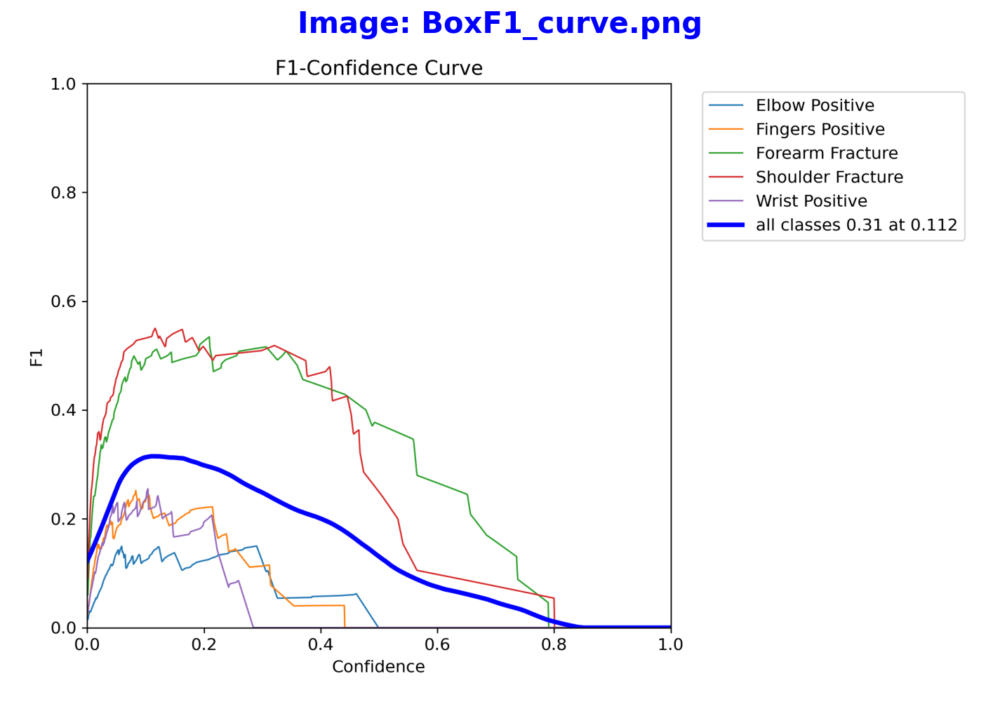

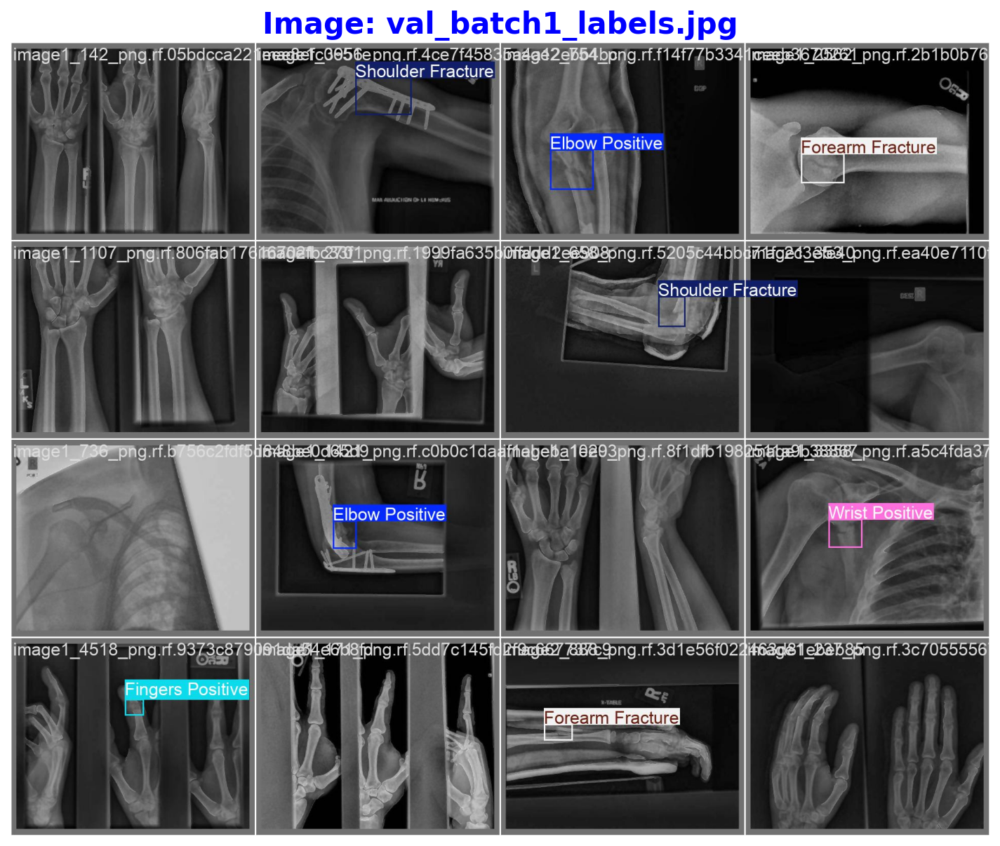

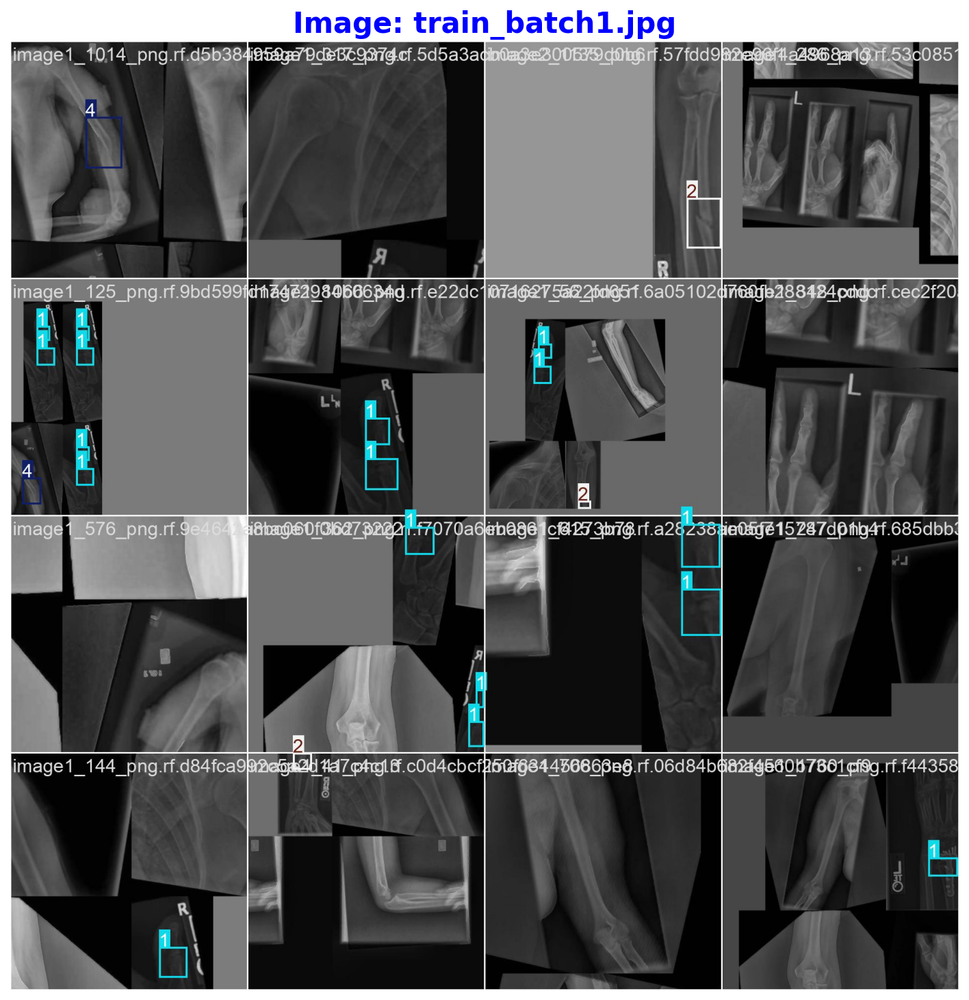

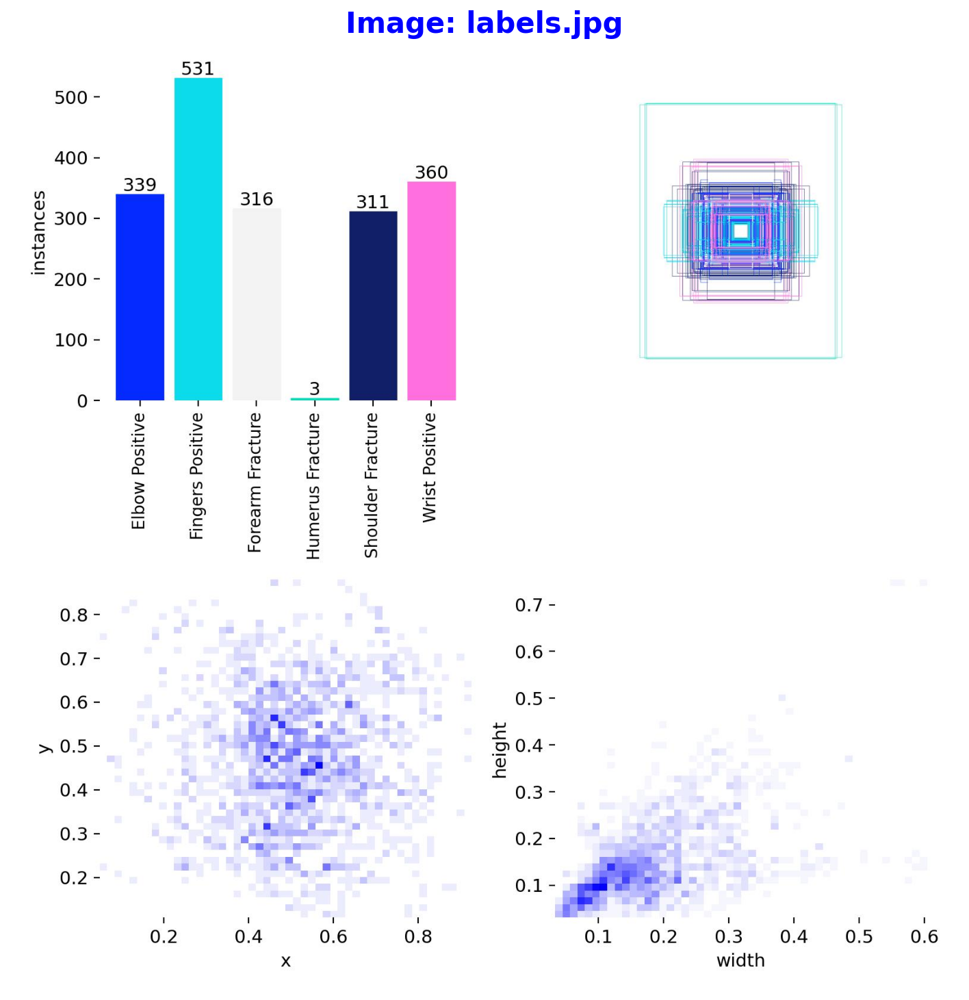

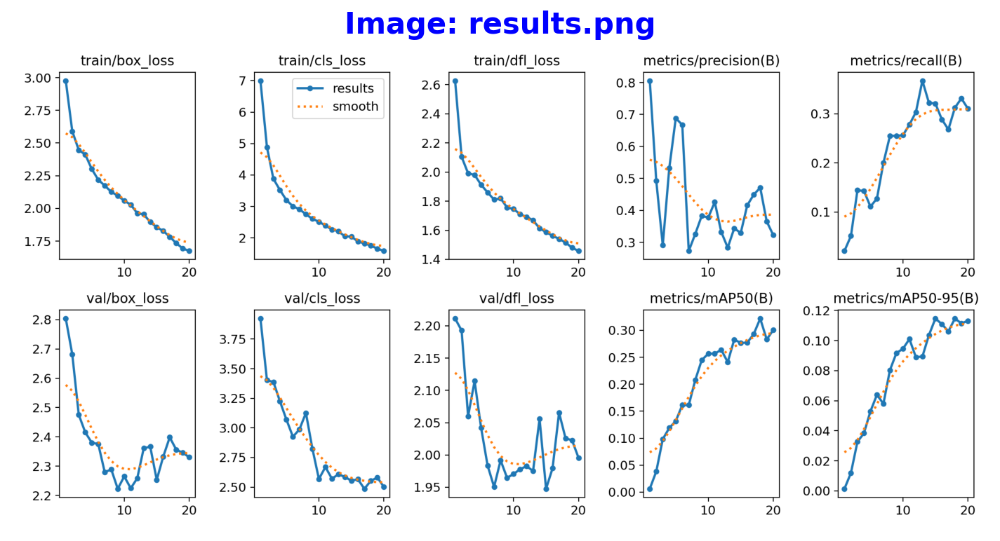

...

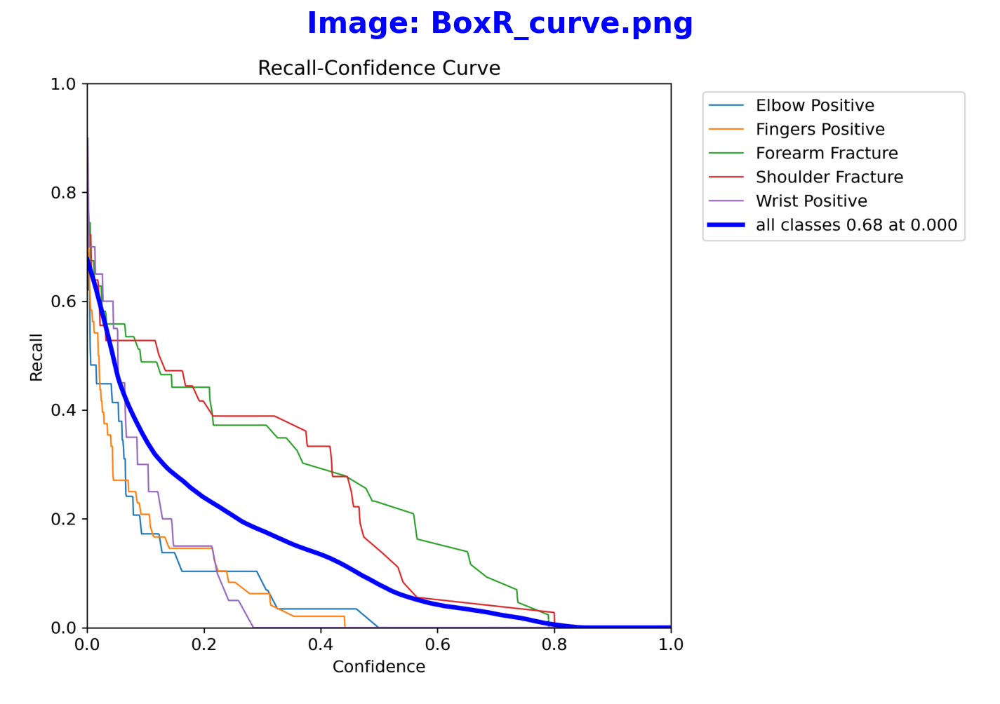

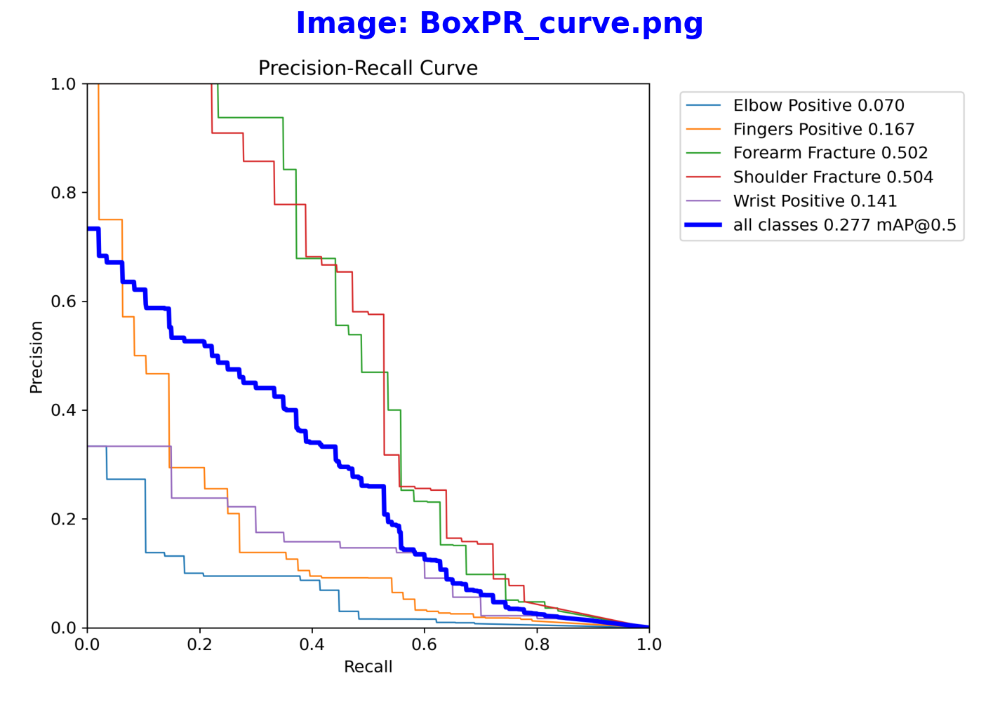

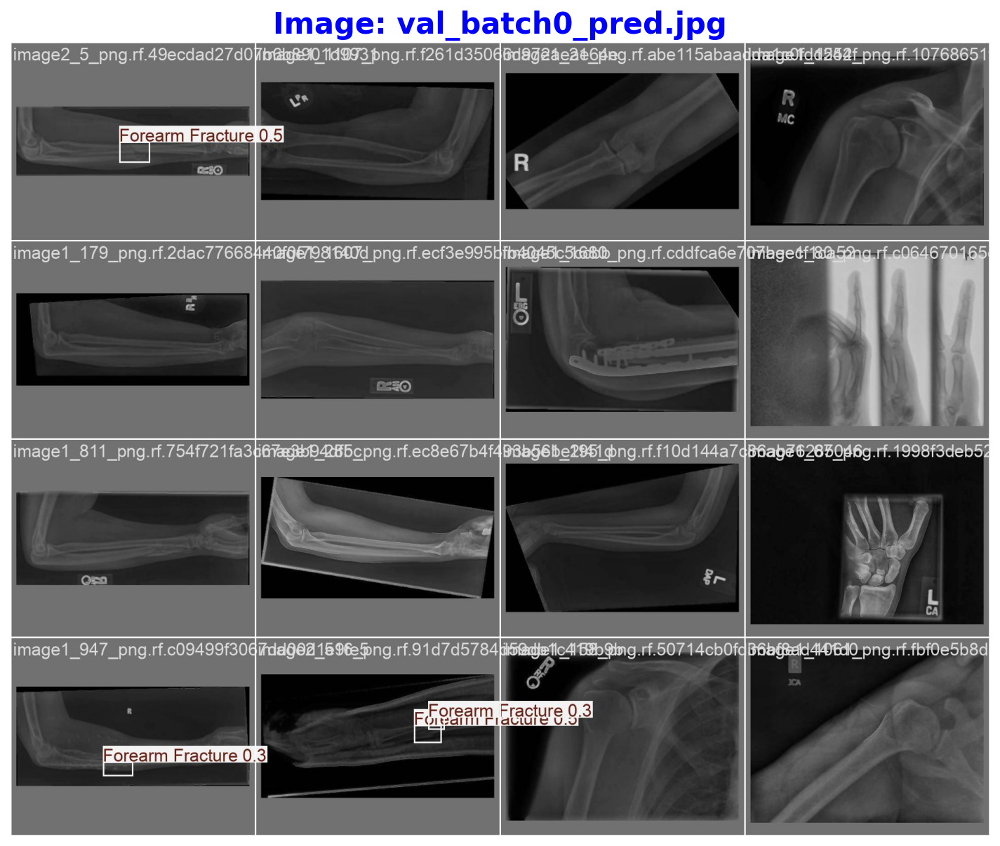

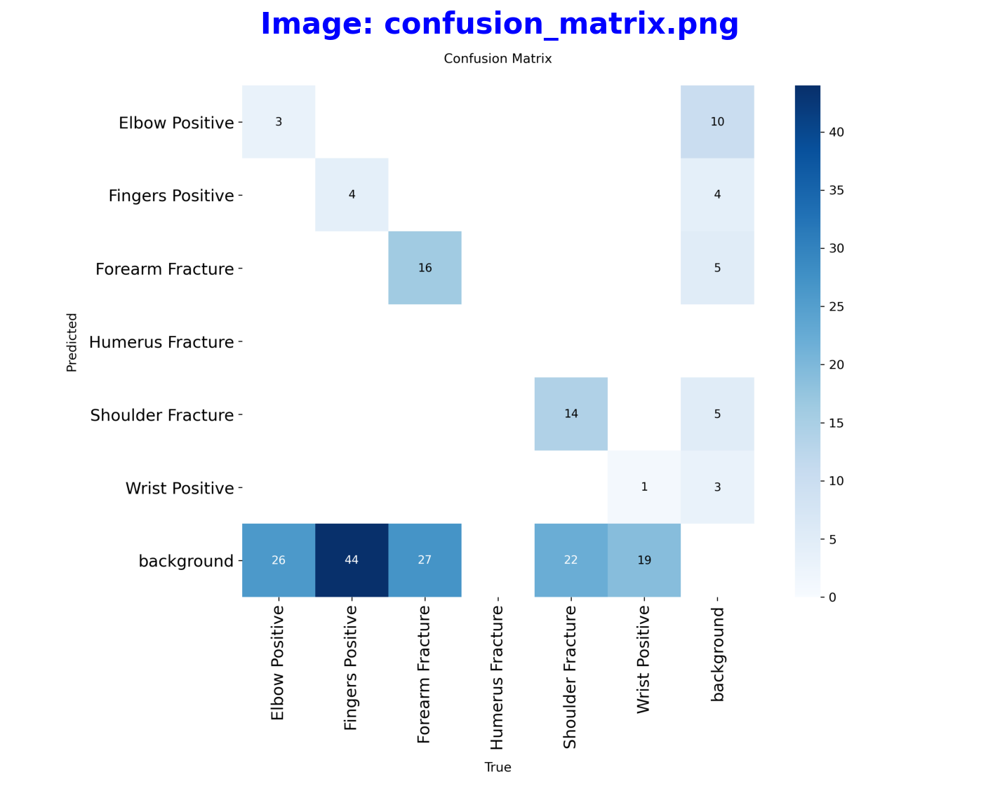

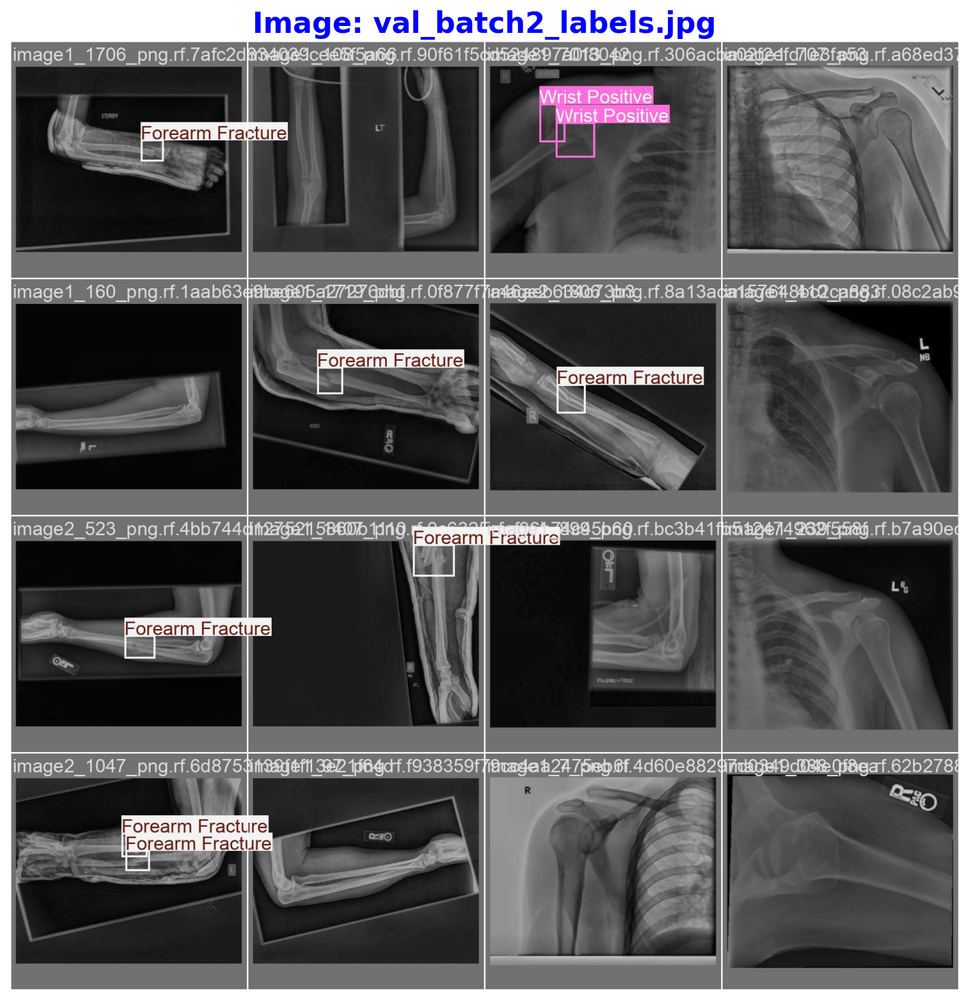

In [36]:
# Define the path to the directory containing the images
image_directory = "/kaggle/working/yolo_training/fracture_detector_v1"
#image_directory = "/kaggle/working/runs/detect/train"

# Iterate through all image files in the directory
for filename in os.listdir(image_directory):
    if filename.lower().endswith((".jpg",".png")):
        image_path = os.path.join(image_directory, filename)
        image = Image.open(image_path)

        # Display the image
        plt.figure(figsize=(12, 12), dpi=150)
        plt.imshow(image)
        plt.title(f"Image: {filename}", fontsize=20, fontweight='bold', color='blue')  # Customize font properties
        plt.axis("off")  # Hide axes
        plt.show()

In [37]:
Result_Final_model = pd.read_csv('/kaggle/working/yolo_training/fracture_detector_v1/results.csv')
Result_Final_model.tail(10)

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
10,11,692.641,2.02893,2.39339,1.71006,0.42610,0.27815,0.25667,0.10101,2.22466,2.66953,1.97793,0.000802,0.000802,0.000802
11,12,755.020,1.96348,2.26903,1.69196,0.33272,0.30352,0.26395,0.08901,2.25871,2.57154,1.98263,0.000782,0.000782,0.000782
12,13,817.287,1.95482,2.20979,1.66866,0.28346,0.36760,0.24092,0.08937,2.36129,2.60824,1.97516,0.000762,0.000762,0.000762
13,14,879.656,1.89574,2.04944,1.61390,0.34399,0.32267,0.28284,0.10358,2.36669,2.58642,2.05613,0.000743,0.000743,0.000743
14,15,941.958,1.85633,2.04245,1.58695,0.32939,0.32105,0.27670,0.11467,2.25345,2.55377,1.94761,0.000723,0.000723,0.000723
15,16,1004.350,1.82794,1.88761,1.56235,0.41576,0.28867,0.27711,0.11096,2.33242,2.56659,1.97936,0.000703,0.000703,0.000703
16,17,1066.680,1.78310,1.82748,1.54123,0.44921,0.26812,0.29301,0.10614,2.39852,2.48607,2.06553,0.000683,0.000683,0.000683
17,18,1128.680,1.73447,1.75498,1.51557,0.47123,0.31254,0.32180,0.11465,2.35668,2.55376,2.02586,0.000663,0.000663,0.000663
18,19,1191.010,1.69403,1.66068,1.48022,0.36544,0.33155,0.28300,0.11149,2.34560,2.58124,2.02274,0.000644,0.000644,0.000644
19,20,1253.260,1.67511,1.58722,1.45825,0.32313,0.31082,0.30046,0.11317,2.33092,2.50142,1.99550,0.000624,0.000624,0.000624


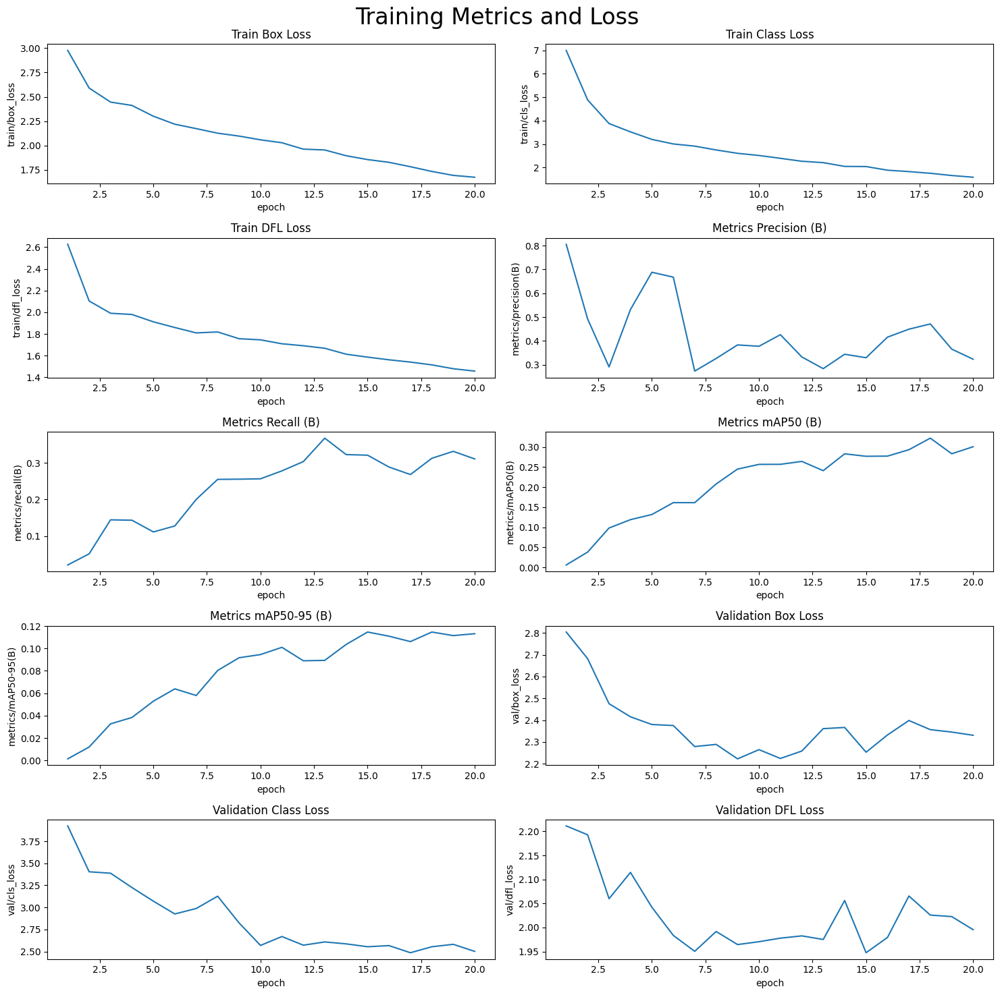

In [38]:
# Read the results.csv file as a pandas dataframe,
Result_Final_model.columns = Result_Final_model.columns.str.strip()

# Create subplots
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# Plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=Result_Final_model, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=Result_Final_model, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=Result_Final_model, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=Result_Final_model, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=Result_Final_model, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=Result_Final_model, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=Result_Final_model, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=Result_Final_model, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=Result_Final_model, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=Result_Final_model, ax=axs[4,1])

# Set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')


plt.suptitle('Training Metrics and Loss', fontsize=24)
plt.subplots_adjust(top=0.8)
plt.tight_layout()
plt.show()

In [40]:
# Loading the best performing model
Valid_model = YOLO('/kaggle/working/yolo_training/fracture_detector_v1/weights/best.pt')

# Evaluating the model on the validset
metrics = Valid_model.val(split = 'val')

# final results 
print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

Ultralytics 8.3.217 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 100 layers, 9,415,122 parameters, 0 gradients
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 995.9±465.0 MB/s, size: 28.2 KB)
val: Scanning /kaggle/working/BoneFracture_Preprocessed/valid/labels.cache... 348 images, 175 backgrounds, 17 corrupt: 100% ━━━━━━━━━━━━ 348/348 531.9Kit/s 0.0s
val: /kaggle/working/BoneFracture_Preprocessed/valid/images/image1_1090_png.rf.de645f822a5e36175c5e988223f4eeb0.jpg: ignoring corrupt image/label: Label class 6 exceeds dataset class count 6. Possible class labels are 0-5
val: /kaggle/working/BoneFracture_Preprocessed/valid/images/image1_111_png.rf.3893d8f7588cea4d796d26119e52637f.jpg: ignoring corrupt image/label: Label class 6 exceeds dataset class count 6. Possible class labels are 0-5
val: /kaggle/working/BoneFracture_Preprocessed/valid/images/image1_119_png.rf.77de12cb566fc295603927e2a5b2748a.jpg: ignoring corrupt image/label: Label class 6

# Test the sample image after trained


0: 640x640 (no detections), 16.0ms
Speed: 1.9ms preprocess, 16.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /kaggle/working/runs/detect/predict
4 labels saved to /kaggle/working/runs/detect/predict/labels

0: 640x640 (no detections), 16.0ms
Speed: 1.9ms preprocess, 16.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /kaggle/working/runs/detect/predict
4 labels saved to /kaggle/working/runs/detect/predict/labels

0: 640x640 (no detections), 16.0ms
Speed: 1.8ms preprocess, 16.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /kaggle/working/runs/detect/predict
4 labels saved to /kaggle/working/runs/detect/predict/labels

0: 640x640 1 person, 15.9ms
Speed: 1.6ms preprocess, 15.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /kaggle/working/runs/detect/predict
4 labels saved to /kaggle/working/runs/detect/predict/labels

0: 640x640 (no det

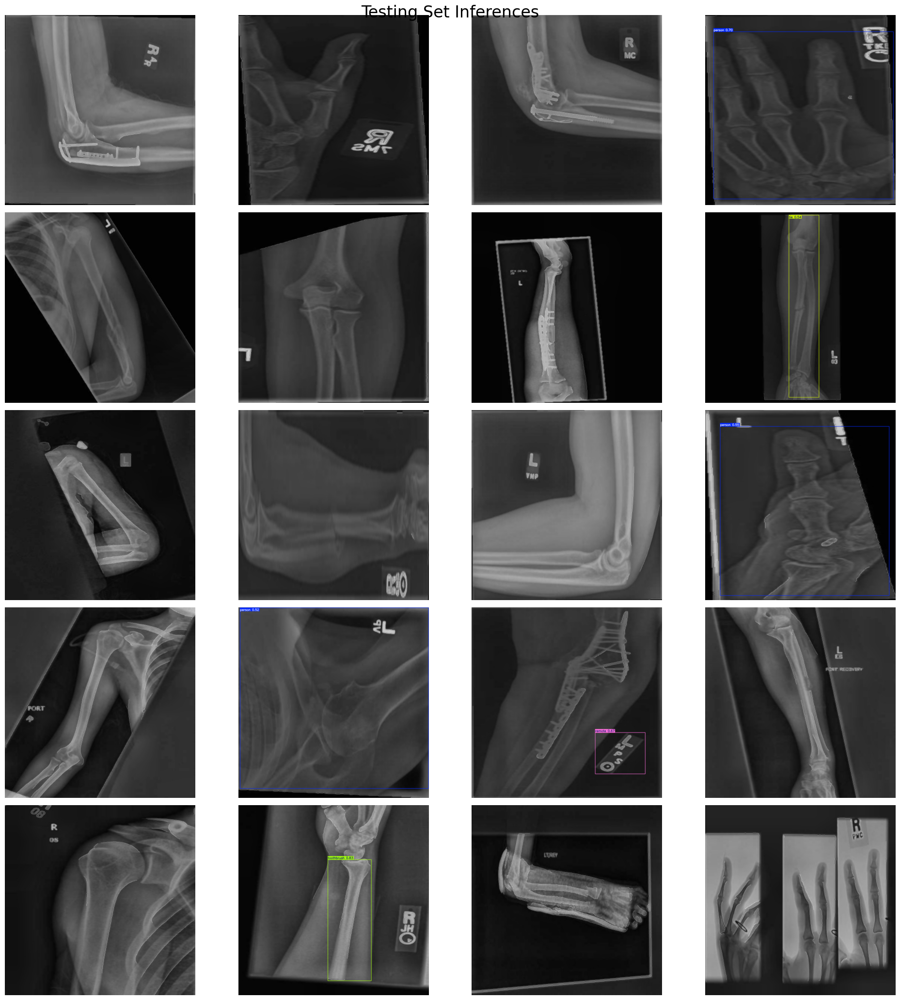

In [47]:
# Normalization function
def normalize_image(image):
    return image / 255.0

# Image resizing function
def resize_image(image, size=(640,640)):
    return cv2.resize(image, size)

# Path to validation images
dataset_path = '/kaggle/working/BoneFracture_Preprocessed'  # Place your dataset path here
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

# List of all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Check if there are images in the directory
if len(image_files) > 0:
    # Select 9 images at equal intervals
    num_images = len(image_files)
    step_size = max(1, num_images // 20)  # Ensure the interval is at least 1
    selected_images = [image_files[i] for i in range(0, num_images, step_size)]

    # Prepare subplots
    fig, axes = plt.subplots(5, 4, figsize=(20, 21))
    fig.suptitle('Testing Set Inferences', fontsize=24)

    for i, ax in enumerate(axes.flatten()):
        if i < len(selected_images):
            image_path = os.path.join(valid_images_path, selected_images[i])
            
            # Load image
            image = cv2.imread(image_path)
            
            # Check if the image is loaded correctly
            if image is not None:
                # Resize image
                resized_image = resize_image(image, size=(640,640))
                # Normalize image
                normalized_image = normalize_image(resized_image)
                
                # Convert the normalized image to uint8 data type
                normalized_image_uint8 = (normalized_image * 255).astype(np.uint8)
                
                # Predict with the model
                results = model.predict(source=normalized_image_uint8, imgsz=640, conf=0.5)
                
                # Plot image with labels
                annotated_image = results[0].plot(line_width=1)
                annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
                ax.imshow(annotated_image_rgb)
            else:
                print(f"Failed to load image {image_path}")

        ax.axis('off')

    plt.tight_layout()
    plt.show()

# Class names for fracture detection

In [52]:
# Inference on new test images
test_data_path = "/kaggle/input/test-data"
res = model.predict(source=test_data_path, save=True, save_txt=True, conf=0.25)


image 1/4 /kaggle/input/test-data/Broken Bone 1.jpg: 448x640 1 tie, 13.3ms
image 2/4 /kaggle/input/test-data/Broken Bone 2.jpg: 640x544 2 ties, 15.7ms
image 3/4 /kaggle/input/test-data/Broken Bone 3.jpg: 320x640 (no detections), 11.9ms
image 4/4 /kaggle/input/test-data/No Broken Bone 1.jpg: 640x640 1 scissors, 16.6ms
Speed: 2.6ms preprocess, 14.4ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /kaggle/working/runs/detect/predict
4 labels saved to /kaggle/working/runs/detect/predict/labels


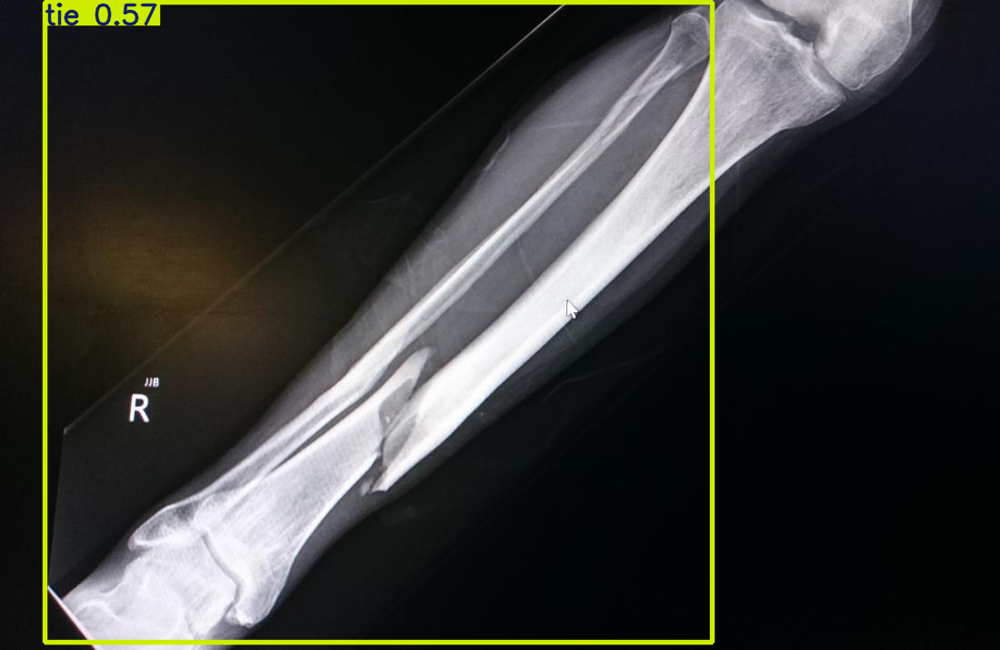

In [53]:
#show results
plot = res[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))

In [55]:

# fracture_classes = ["Elbow Positive", "Fingers Positive", "Forearm Fracture", 
#                     "Humerus Fracture", "Shoulder Fracture", "Wrist Positive"]

# # Confidence threshold for classification
# confidence_threshold = 0.25

# # Classify and save results
# classification_summary = []

# for i, result in enumerate(res):
#     image_name = os.path.basename(result.path)
#     df = result.to_df()

#     # Filter by confidence and class
#     is_fracture = not df.empty and any((df["name"].isin(fracture_classes)) & (df["confidence"] > confidence_threshold))
#     classification = "Broken Bone" if is_fracture else "Non-Broken Bone"

#     # Save classification info
#     classification_summary.append({
#         "Image": image_name,
#         "Classification": classification
#     })

#     print(f"Image: {image_name} → Classification: {classification}")

# Dataset restructured

In [56]:
import shutil

# Define the directory to delete
working_dir = "/kaggle/working/BoneFracture_Preprocessed"

# Delete the entire directory
shutil.rmtree(working_dir, ignore_errors=True)

print("✅ All files in '/kaggle/working/BoneFracture_Preprocessed/' deleted successfully!")

✅ All files in '/kaggle/working/BoneFracture_Preprocessed/' deleted successfully!


In [57]:
import os
import shutil

# Step 1: Delete Old Processed Data
working_dir = "/kaggle/working/BoneFracture_Preprocessed"
shutil.rmtree(working_dir, ignore_errors=True)

# Step 2: Define Source Paths
src_train_images = "/kaggle/input/bone-fracture-detection-computer-vision-project/bone fracture detection.v4-v4.yolov8/train/images"
src_train_labels = "/kaggle/input/bone-fracture-detection-computer-vision-project/bone fracture detection.v4-v4.yolov8/train/labels"

src_valid_images = "/kaggle/input/bone-fracture-detection-computer-vision-project/bone fracture detection.v4-v4.yolov8/valid/images"
src_valid_labels = "/kaggle/input/bone-fracture-detection-computer-vision-project/bone fracture detection.v4-v4.yolov8/valid/labels"

src_test_images = "/kaggle/input/bone-fracture-detection-computer-vision-project/bone fracture detection.v4-v4.yolov8/test/images"

# Step 3: Define Destination Paths
dest_base = "/kaggle/working/BoneFracture_Preprocessed"
dest_train_fractured = os.path.join(dest_base, "train/Fractured")
dest_train_non_fractured = os.path.join(dest_base, "train/Non-Fractured")
dest_valid_fractured = os.path.join(dest_base, "valid/Fractured")
dest_valid_non_fractured = os.path.join(dest_base, "valid/Non-Fractured")
dest_test_images = os.path.join(dest_base, "test/images")

# Step 4: Create Necessary Directories
for path in [dest_train_fractured, dest_train_non_fractured, dest_valid_fractured, dest_valid_non_fractured, dest_test_images]:
    os.makedirs(path, exist_ok=True)

# Step 5: Function to Classify and Copy Images
def classify_images(image_folder, label_folder, dest_fractured, dest_non_fractured):
    for image_name in os.listdir(image_folder):
        image_path = os.path.join(image_folder, image_name)
        
        if not os.path.isfile(image_path):  # Ensure the file exists
            continue
        
        label_path = os.path.join(label_folder, image_name.replace(".jpg", ".txt").replace(".png", ".txt"))

        if os.path.exists(label_path) and os.path.getsize(label_path) > 0:
            shutil.copy(image_path, os.path.join(dest_fractured, image_name))
        else:
            shutil.copy(image_path, os.path.join(dest_non_fractured, image_name))

# Step 6: Process Training & Validation Data
classify_images(src_train_images, src_train_labels, dest_train_fractured, dest_train_non_fractured)
classify_images(src_valid_images, src_valid_labels, dest_valid_fractured, dest_valid_non_fractured)

# Step 7: Copy Test Images (No Labels, Just Images)
for image_name in os.listdir(src_test_images):
    image_path = os.path.join(src_test_images, image_name)
    if os.path.isfile(image_path):
        shutil.copy(image_path, os.path.join(dest_test_images, image_name))

print("✅ Dataset successfully structured: Train (Fractured/Non-Fractured), Valid (Fractured/Non-Fractured), and Test (Images)!")

✅ Dataset successfully structured: Train (Fractured/Non-Fractured), Valid (Fractured/Non-Fractured), and Test (Images)!


# CNN model 

In [58]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report
import numpy as np
from PIL import Image

# ✅ Device setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ✅ Data Augmentation (fix imbalance)
transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=3),
    transforms.Resize((384, 384)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.3),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5]*3, std=[0.5]*3)
])

# ✅ Load Data
train_dataset = datasets.ImageFolder(
    root="/kaggle/working/BoneFracture_Preprocessed/train", 
    transform=transform
)
valid_dataset = datasets.ImageFolder(
    root="/kaggle/working/BoneFracture_Preprocessed/valid", 
    transform=transform
)


train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=16, shuffle=False)


# resnet50 model

In [ ]:
# ✅ Model with Dropout
model_resnet = models.resnet50(pretrained=True)

num_ftrs = model_resnet.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to ``nn.Linear(num_ftrs, len(class_names))``.
model_resnet.fc = nn.Linear(num_ftrs, 1)

model_resnet = model_resnet.to(device)

In [71]:
# ✅ Class Imbalance Handling
labels_list = [label for _, label in train_dataset]
fractured = sum(labels_list)
non_fractured = len(labels_list) - fractured
pos_weight = torch.tensor([non_fractured / fractured]).to(device)


# ✅ Loss, Optimizer & Scheduler
criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight)
optimizer = optim.Adam(model_resnet.parameters(), lr=1e-4, weight_decay=1e-4)  # L2 Regularization
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=10, factor=0.5)


# ✅ Training with Early Stopping

In [78]:
best_val_loss = float('inf')
patience = 10  # Stop training if val_loss doesn't improve after 3 epochs
wait = 0

def train_model(model, train_loader, valid_loader, epochs=10):
    global best_val_loss, wait

    for epoch in range(epochs):
        model.train()
        train_loss = 0

        for images, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}"):
            images, labels = images.to(device), labels.float().unsqueeze(1).to(device)
            
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item()

        # ✅ Validation
        model.eval()
        valid_loss = 0
        y_true, y_pred = [], []

        with torch.no_grad():
            for images, labels in tqdm(valid_loader):
                images, labels = images.to(device), labels.float().unsqueeze(1).to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                valid_loss += loss.item()

                probs = torch.sigmoid(outputs)
                preds = (probs > 0.6).int()  # Adjust threshold

                y_true.extend(labels.cpu().numpy())
                y_pred.extend(preds.cpu().numpy())

        scheduler.step(valid_loss)

        # ✅ Early Stopping
        if valid_loss < best_val_loss:
            best_val_loss = valid_loss
            torch.save(model.state_dict(), "/kaggle/working/best_model50.pth")
            wait = 0
        else:
            wait += 1
            if wait >= patience:
                print("🔥 Early Stopping Activated!")
                break

        print(f"Epoch [{epoch+1}/{epochs}]  Train Loss: {train_loss/len(train_loader):.4f}  Valid Loss: {valid_loss/len(valid_loader):.4f}")
        print(classification_report(y_true, y_pred, target_names=["Non-Fractured", "Fractured"]))



The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


In [73]:
train_model(model_resnet, train_loader, valid_loader, epochs=30)
print("✅ Training Completed!")

Epoch 1/30:   0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch [1/30]  Train Loss: 0.5467  Valid Loss: 0.4557
               precision    recall  f1-score   support

Non-Fractured       0.83      0.80      0.81       173
    Fractured       0.81      0.83      0.82       175

     accuracy                           0.82       348
    macro avg       0.82      0.82      0.82       348
 weighted avg       0.82      0.82      0.82       348



Epoch 2/30:   0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch [2/30]  Train Loss: 0.3973  Valid Loss: 0.4425
               precision    recall  f1-score   support

Non-Fractured       0.76      0.86      0.81       173
    Fractured       0.84      0.73      0.78       175

     accuracy                           0.80       348
    macro avg       0.80      0.80      0.80       348
 weighted avg       0.80      0.80      0.80       348



Epoch 3/30:   0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch [3/30]  Train Loss: 0.3377  Valid Loss: 0.5231
               precision    recall  f1-score   support

Non-Fractured       0.84      0.75      0.80       173
    Fractured       0.78      0.86      0.82       175

     accuracy                           0.81       348
    macro avg       0.81      0.81      0.81       348
 weighted avg       0.81      0.81      0.81       348



Epoch 4/30:   0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch [4/30]  Train Loss: 0.2666  Valid Loss: 0.4736
               precision    recall  f1-score   support

Non-Fractured       0.87      0.75      0.80       173
    Fractured       0.78      0.89      0.83       175

     accuracy                           0.82       348
    macro avg       0.82      0.82      0.82       348
 weighted avg       0.82      0.82      0.82       348



Epoch 5/30:   0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch [5/30]  Train Loss: 0.2336  Valid Loss: 0.4588
               precision    recall  f1-score   support

Non-Fractured       0.79      0.84      0.82       173
    Fractured       0.84      0.78      0.81       175

     accuracy                           0.81       348
    macro avg       0.81      0.81      0.81       348
 weighted avg       0.81      0.81      0.81       348



Epoch 6/30:   0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch [6/30]  Train Loss: 0.1814  Valid Loss: 0.4698
               precision    recall  f1-score   support

Non-Fractured       0.79      0.83      0.81       173
    Fractured       0.83      0.78      0.80       175

     accuracy                           0.81       348
    macro avg       0.81      0.81      0.81       348
 weighted avg       0.81      0.81      0.81       348



Epoch 7/30:   0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch [7/30]  Train Loss: 0.1626  Valid Loss: 0.4512
               precision    recall  f1-score   support

Non-Fractured       0.84      0.85      0.85       173
    Fractured       0.85      0.85      0.85       175

     accuracy                           0.85       348
    macro avg       0.85      0.85      0.85       348
 weighted avg       0.85      0.85      0.85       348



Epoch 8/30:   0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch [8/30]  Train Loss: 0.1430  Valid Loss: 0.4243
               precision    recall  f1-score   support

Non-Fractured       0.85      0.84      0.85       173
    Fractured       0.85      0.85      0.85       175

     accuracy                           0.85       348
    macro avg       0.85      0.85      0.85       348
 weighted avg       0.85      0.85      0.85       348



Epoch 9/30:   0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch [9/30]  Train Loss: 0.1592  Valid Loss: 0.5526
               precision    recall  f1-score   support

Non-Fractured       0.77      0.86      0.81       173
    Fractured       0.84      0.75      0.80       175

     accuracy                           0.80       348
    macro avg       0.81      0.80      0.80       348
 weighted avg       0.81      0.80      0.80       348



Epoch 10/30:   0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch [10/30]  Train Loss: 0.1314  Valid Loss: 0.4720
               precision    recall  f1-score   support

Non-Fractured       0.81      0.84      0.83       173
    Fractured       0.84      0.81      0.82       175

     accuracy                           0.82       348
    macro avg       0.82      0.82      0.82       348
 weighted avg       0.83      0.82      0.82       348



Epoch 11/30:   0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch [11/30]  Train Loss: 0.1229  Valid Loss: 0.7701
               precision    recall  f1-score   support

Non-Fractured       0.92      0.69      0.79       173
    Fractured       0.76      0.94      0.84       175

     accuracy                           0.82       348
    macro avg       0.84      0.82      0.82       348
 weighted avg       0.84      0.82      0.82       348



Epoch 12/30:   0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch [12/30]  Train Loss: 0.1008  Valid Loss: 0.6130
               precision    recall  f1-score   support

Non-Fractured       0.86      0.80      0.83       173
    Fractured       0.81      0.87      0.84       175

     accuracy                           0.84       348
    macro avg       0.84      0.84      0.84       348
 weighted avg       0.84      0.84      0.84       348



Epoch 13/30:   0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch [13/30]  Train Loss: 0.0973  Valid Loss: 0.5637
               precision    recall  f1-score   support

Non-Fractured       0.89      0.76      0.82       173
    Fractured       0.79      0.90      0.84       175

     accuracy                           0.83       348
    macro avg       0.84      0.83      0.83       348
 weighted avg       0.84      0.83      0.83       348



Epoch 14/30:   0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch [14/30]  Train Loss: 0.0742  Valid Loss: 0.6722
               precision    recall  f1-score   support

Non-Fractured       0.77      0.89      0.82       173
    Fractured       0.87      0.73      0.80       175

     accuracy                           0.81       348
    macro avg       0.82      0.81      0.81       348
 weighted avg       0.82      0.81      0.81       348



Epoch 15/30:   0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch [15/30]  Train Loss: 0.0958  Valid Loss: 0.5263
               precision    recall  f1-score   support

Non-Fractured       0.81      0.88      0.85       173
    Fractured       0.87      0.79      0.83       175

     accuracy                           0.84       348
    macro avg       0.84      0.84      0.84       348
 weighted avg       0.84      0.84      0.84       348



Epoch 16/30:   0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch [16/30]  Train Loss: 0.0802  Valid Loss: 0.7683
               precision    recall  f1-score   support

Non-Fractured       0.93      0.65      0.76       173
    Fractured       0.73      0.95      0.83       175

     accuracy                           0.80       348
    macro avg       0.83      0.80      0.79       348
 weighted avg       0.83      0.80      0.79       348



Epoch 17/30:   0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch [17/30]  Train Loss: 0.0610  Valid Loss: 0.6277
               precision    recall  f1-score   support

Non-Fractured       0.79      0.83      0.81       173
    Fractured       0.82      0.79      0.80       175

     accuracy                           0.81       348
    macro avg       0.81      0.81      0.81       348
 weighted avg       0.81      0.81      0.81       348



Epoch 18/30:   0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

🔥 Early Stopping Activated!
✅ Training Completed!


# Test the model

In [74]:
# ✅ Load Best Model
model_resnet.load_state_dict(torch.load("/kaggle/working/best_model50.pth", map_location=device))
model_resnet.eval()

# ✅ Inference Transform
inference_transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=3),
    transforms.Resize((384, 384)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5]*3, std=[0.5]*3)
])

# ✅ Test Images
test_images = [
    "/kaggle/input/test-data/Broken Bone 1.jpg",
    "/kaggle/input/test-data/Broken Bone 2.jpg",
    "/kaggle/input/test-data/Broken Bone 3.jpg",
    "/kaggle/input/test-data/No Broken Bone 1.jpg"
]

class_labels = ["Non-Fractured", "Fractured"]

# ✅ Run Inference with Confidence Threshold
print("\n🔎 Evaluating Test Images:")
for img_path in test_images:
    try:
        image = Image.open(img_path).convert("RGB")
        image_tensor = inference_transform(image).unsqueeze(0).to(device)

        with torch.no_grad():
            output = model_resnet(image_tensor)
            prob = torch.sigmoid(output).item()
            
            # Dynamic Threshold Adjustment
            threshold = 0.65 if prob > 0.75 else 0.55
            pred = 1 if prob > threshold else 0
            conf = prob if pred == 1 else 1 - prob

        print(f"🩻 Image: {os.path.basename(img_path)} → Predicted: {class_labels[pred]} (Confidence: {conf:.4f})")

    except Exception as e:
        print(f"❌ Error loading {img_path}: {e}")


🔎 Evaluating Test Images:
🩻 Image: Broken Bone 1.jpg → Predicted: Fractured (Confidence: 0.8660)
🩻 Image: Broken Bone 2.jpg → Predicted: Fractured (Confidence: 0.9909)
🩻 Image: Broken Bone 3.jpg → Predicted: Fractured (Confidence: 0.9681)
🩻 Image: No Broken Bone 1.jpg → Predicted: Fractured (Confidence: 1.0000)


# efficientnet_b3

In [85]:
# ✅ Load Pretrained EfficientNet-B3 Model
model_efficientnet_b3 = models.efficientnet_b3(pretrained=True)

# ✅ Modify the Final Layer for Binary Classification
model_efficientnet_b3.classifier = nn.Sequential(
    nn.Linear(model_efficientnet_b3.classifier[1].in_features, 1),  # ✅ Adjust final layer
    nn.Sigmoid()  # ✅ Binary output (0 or 1)
)

model_efficientnet_b3 = model_efficientnet_b3.to(device)

# ✅ Loss & Optimizer
criterion = nn.BCELoss()  # ✅ Binary Cross-Entropy
optimizer = optim.Adam(model_efficientnet_b3.parameters(), lr=0.0001)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)  # ✅ LR Decay every 7 epochs

In [86]:
best_val_loss = float('inf')
patience = 10  # Stop training if val_loss doesn't improve after 3 epochs
wait = 0

def train_model(model, train_loader, valid_loader, epochs=10):
    global best_val_loss, wait

    for epoch in range(epochs):
        model.train()
        train_loss = 0

        for images, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}"):
            images, labels = images.to(device), labels.float().unsqueeze(1).to(device)
            
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item()

        # ✅ Validation
        model.eval()
        valid_loss = 0
        y_true, y_pred = [], []

        with torch.no_grad():
            for images, labels in tqdm(valid_loader):
                images, labels = images.to(device), labels.float().unsqueeze(1).to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                valid_loss += loss.item()

                probs = torch.sigmoid(outputs)
                preds = (probs > 0.6).int()  # Adjust threshold

                y_true.extend(labels.cpu().numpy())
                y_pred.extend(preds.cpu().numpy())

        scheduler.step(valid_loss)

        # ✅ Early Stopping
        if valid_loss < best_val_loss:
            best_val_loss = valid_loss
            torch.save(model.state_dict(), "/kaggle/working/best_model_efficient.pth")
            wait = 0
        else:
            wait += 1
            if wait >= patience:
                print("🔥 Early Stopping Activated!")
                break

        print(f"Epoch [{epoch+1}/{epochs}]  Train Loss: {train_loss/len(train_loader):.4f}  Valid Loss: {valid_loss/len(valid_loader):.4f}")
        print(classification_report(y_true, y_pred, target_names=["Non-Fractured", "Fractured"]))



In [ ]:
train_model(model_efficientnet_b3, train_loader, valid_loader, epochs=30)
print("✅ Training Completed!")

Epoch 1/30:   0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch [1/30]  Train Loss: 0.5084  Valid Loss: 0.3701
               precision    recall  f1-score   support

Non-Fractured       0.91      0.77      0.83       173
    Fractured       0.80      0.93      0.86       175

     accuracy                           0.85       348
    macro avg       0.86      0.85      0.85       348
 weighted avg       0.86      0.85      0.85       348



Epoch 2/30:   0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch [2/30]  Train Loss: 0.3222  Valid Loss: 0.3673
               precision    recall  f1-score   support

Non-Fractured       0.93      0.72      0.81       173
    Fractured       0.77      0.94      0.85       175

     accuracy                           0.83       348
    macro avg       0.85      0.83      0.83       348
 weighted avg       0.85      0.83      0.83       348



Epoch 3/30:   0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch [3/30]  Train Loss: 0.3002  Valid Loss: 0.3587
               precision    recall  f1-score   support

Non-Fractured       0.91      0.76      0.83       173
    Fractured       0.80      0.93      0.86       175

     accuracy                           0.84       348
    macro avg       0.85      0.84      0.84       348
 weighted avg       0.85      0.84      0.84       348



Epoch 4/30:   0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch [4/30]  Train Loss: 0.2736  Valid Loss: 0.3493
               precision    recall  f1-score   support

Non-Fractured       0.90      0.78      0.84       173
    Fractured       0.81      0.91      0.86       175

     accuracy                           0.85       348
    macro avg       0.85      0.85      0.85       348
 weighted avg       0.85      0.85      0.85       348



Epoch 5/30:   0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch [5/30]  Train Loss: 0.2534  Valid Loss: 0.3797
               precision    recall  f1-score   support

Non-Fractured       0.90      0.76      0.82       173
    Fractured       0.79      0.92      0.85       175

     accuracy                           0.84       348
    macro avg       0.85      0.84      0.84       348
 weighted avg       0.85      0.84      0.84       348



Epoch 6/30:   0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch [6/30]  Train Loss: 0.2299  Valid Loss: 0.3618
               precision    recall  f1-score   support

Non-Fractured       0.89      0.78      0.83       173
    Fractured       0.81      0.91      0.85       175

     accuracy                           0.84       348
    macro avg       0.85      0.84      0.84       348
 weighted avg       0.85      0.84      0.84       348



Epoch 7/30:   0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch [7/30]  Train Loss: 0.2230  Valid Loss: 0.3620
               precision    recall  f1-score   support

Non-Fractured       0.92      0.76      0.84       173
    Fractured       0.80      0.94      0.86       175

     accuracy                           0.85       348
    macro avg       0.86      0.85      0.85       348
 weighted avg       0.86      0.85      0.85       348



Epoch 8/30:   0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch [8/30]  Train Loss: 0.2145  Valid Loss: 0.3689
               precision    recall  f1-score   support

Non-Fractured       0.90      0.79      0.84       173
    Fractured       0.82      0.91      0.86       175

     accuracy                           0.85       348
    macro avg       0.86      0.85      0.85       348
 weighted avg       0.86      0.85      0.85       348



Epoch 9/30:   0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch [9/30]  Train Loss: 0.1863  Valid Loss: 0.3685
               precision    recall  f1-score   support

Non-Fractured       0.91      0.82      0.86       173
    Fractured       0.83      0.92      0.88       175

     accuracy                           0.87       348
    macro avg       0.87      0.87      0.87       348
 weighted avg       0.87      0.87      0.87       348



Epoch 10/30:   0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Epoch [10/30]  Train Loss: 0.1819  Valid Loss: 0.4123
               precision    recall  f1-score   support

Non-Fractured       0.90      0.77      0.83       173
    Fractured       0.80      0.91      0.86       175

     accuracy                           0.84       348
    macro avg       0.85      0.84      0.84       348
 weighted avg       0.85      0.84      0.84       348



Epoch 11/30:   0%|          | 0/227 [00:00<?, ?it/s]